In [1]:
import tensorflow as tf
print("Tensorflow version " + tf.__version__)

Tensorflow version 2.5.0


In [2]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
%cd /content/drive/MyDrive/lunchjet/
!mkdir src && cd src && git clone https://github.com/kimito/lunchjet.git
%ls

/content/drive/MyDrive/lunchjet
mkdir: cannot create directory ‘src’: File exists
logs/  models/  src/  train_2021_06_03_04_30_41.tar.gz


In [ ]:
import pathlib
import os
import glob

for tarball_path in glob.glob("./*.tar.gz"):
  data_root_org = tf.keras.utils.get_file(fname='dataset', origin='file://' + os.path.abspath(tarball_path) , extract=True)
data_root = pathlib.Path(pathlib.Path(data_root_org).parents[0]/'control')
print(data_root)

164814848/164812768 [==============================] - 2s 0us/step
/root/.keras/datasets/control


In [ ]:
for item in data_root.iterdir():
  print(item)

/root/.keras/datasets/control/annotations
/root/.keras/datasets/control/images


In [ ]:
annot_paths = sorted(list(pathlib.Path(data_root/'annotations').glob("*")))
print(len(annot_paths))
print(annot_paths[-10:])

6469
[PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_209.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_273.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_341.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_409.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_477.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_541.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_609.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_677.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_777.log'), PosixPath('/root/.keras/datasets/control/annotations/2021_05_22_12_03_47_805.log')]


In [ ]:
import IPython.display as display
import random

image_root = data_root/'images'

for n in range(3):
  annot_path = random.choice(annot_paths)
  with open(annot_path) as f:
    image_path, _, _ = f.readline().split(' ')
    image_path = str(image_root/image_path)
    print(image_path)
    display.display(display.Image(image_path))

In [ ]:
def load_image(img_path):
  image_raw = tf.io.read_file(img_path)
  image = tf.image.decode_jpeg(image_raw, channels=3)
  return image

In [ ]:
lines = []
for annot_file in annot_paths:
  with open(annot_file) as annot:
    for line in annot:
      lines.append(line)

import random
random.seed(20210616)
random.shuffle(lines)
lines_split = {}
lines_split['train'] = lines[:int(len(lines)*0.8)]
lines_split['val'] = lines[int(len(lines)*0.8):int(len(lines)*0.9)]
lines_split['test'] = lines[int(len(lines)*0.9):]
lines = None

image_paths = {}
labels = {}
for type, data in lines_split.items():
  print('{} num: {}'.format(type, len(data)))
  image_paths[type] = []
  labels[type] = []
  for line in data:
    image, steer, speed = line.split(' ')
    image_paths[type].append(str(image_root/image))
    labels[type].append([float(steer), float(speed)])
lines_split = None

print(len(image_paths))
print(len(labels))

train num: 5175
val num: 647
test num: 647
3
3


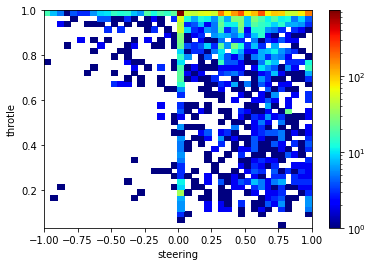

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors

steers = np.array(labels['train'])[:, 0]
throtles = np.array(labels['train'])[:, 1]

fig = plt.figure()
hist = plt.hist2d(steers, throtles, bins=40, cmap=cm.jet, norm=matplotlib.colors.LogNorm())
fig.colorbar(hist[3])
plt.xlabel('steering')
plt.ylabel('throtle')
plt.show()

In [ ]:
dataset = {}
BATCH_SIZE = 32

image_ds = tf.data.Dataset.from_tensor_slices(image_paths['train'])
image_ds = image_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
label_ds = tf.data.Dataset.from_tensor_slices(labels['train'])
ds = tf.data.Dataset.zip((image_ds, label_ds))
ds = ds.shuffle(buffer_size=len(labels['train']))
ds = ds.repeat()
ds = ds.batch(BATCH_SIZE)
ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)
dataset['train'] = ds

image_ds = tf.data.Dataset.from_tensor_slices(image_paths['val'])
image_ds = image_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
label_ds = tf.data.Dataset.from_tensor_slices(labels['val'])
ds = tf.data.Dataset.zip((image_ds, label_ds))
ds = ds.batch(BATCH_SIZE)
ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)
dataset['val'] = ds

image_ds = tf.data.Dataset.from_tensor_slices(image_paths['test'])
image_ds = image_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
label_ds = tf.data.Dataset.from_tensor_slices(labels['test'])
ds = tf.data.Dataset.zip((image_ds, label_ds))
ds = ds.shuffle(buffer_size=len(labels['test']))
ds = ds.batch(BATCH_SIZE)
ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)
dataset['test'] = ds

In [ ]:
for batch in dataset['train'].take(1):
  images_batch, labels_batch = batch
  fig = plt.figure(figsize=(12.0, 10.0))
  fig.suptitle('train dataset')
  for i in range(9):
    image = images_batch[i]
    # image = tf.image.resize(image, [224, 224])
    # image /= 255.0
    label = labels_batch[i]
    label = 'steer={}, throtle={}'.format(tf.strings.as_string(label[0], precision=2).numpy().decode('utf-8'), tf.strings.as_string(label[1], precision=2).numpy().decode('utf-8'))

    subplot = fig.add_subplot(3, 3, i+1)
    subplot.imshow(image)
    subplot.grid(False)
    subplot.set_title(label)

In [ ]:
import tensorflow_hub as hub

%rm -rf logs

preprocessing = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(224, 224),
    tf.keras.layers.experimental.preprocessing.Rescaling(scale=1./255.) 
])

num_classes = 2
model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=[240, 360, 3], name='input'),
    preprocessing,
    hub.KerasLayer("https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1", trainable=False),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(num_classes, activation='linear')
])
model.summary()

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-2),
    loss=tf.keras.losses.mean_squared_error,
    metrics=tf.keras.metrics.mean_absolute_error)
model.fit(dataset['train'],
          epochs=500,
          steps_per_epoch=len(image_paths['train'])/BATCH_SIZE,
          class_weight={0:3., 1:1.},
          callbacks=[tf.keras.callbacks.TensorBoard(),
                     tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True, verbose=1),
                     tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, min_lr=1e-5, patience=20, verbose=1)],
          validation_data=dataset['val'])

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_11 (Sequential)   (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer_8 (KerasLayer)   (None, 1280)              4049564   
_________________________________________________________________
dense_24 (Dense)             (None, 640)               819840    
_________________________________________________________________
batch_normalization_16 (Batc (None, 640)               2560      
_________________________________________________________________
activation_16 (Activation)   (None, 640)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 640)               410240    
_________________________________________________________________
batch_normalization_17 (Batc (None, 640)             

In [ ]:
fig = plt.figure(figsize=(24.0, 12.0))
for test_data in dataset['test'].take(1):
  image, label = test_data
  predict_label = model.predict(image)
  for i in range(BATCH_SIZE):
    title = 'actual: {:.2f} {:.2f}\npredict: {:.2f} {:.2f}'.format(label[i][0], label[i][1], predict_label[i][0], predict_label[i][1])

    subplot = fig.add_subplot(4, 8, i+1)
    subplot.imshow(image[i])
    subplot.grid(False)
    subplot.set_title(title)

In [56]:
%load_ext tensorboard
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [57]:
model.save('models/efficentnet_b0_640_2', overwrite=True)

INFO:tensorflow:Assets written to: models/efficentnet_b0_640_2/assets


INFO:tensorflow:Assets written to: models/efficentnet_b0_640_2/assets


In [58]:
%ls models/efficentnet_b0_640_2/

assets/  keras_metadata.pb  saved_model.pb  variables/


In [59]:
%pwd

'/content/drive/My Drive/lunchjet'

In [61]:
!pip3 install -U tf2onnx
!python3 -m tf2onnx.convert --saved-model 'models/efficentnet_b0_640_2' --opset 13 --inputs input:0[1,240,360,3] --output 'models/efficentnet_b0_640_2.onnx'

Requirement already up-to-date: tf2onnx in /usr/local/lib/python3.7/dist-packages (1.8.5)
2021-06-20 08:58:18.701053: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
/usr/lib/python3.7/runpy.py:125: RuntimeWarning: 'tf2onnx.convert' found in sys.modules after import of package 'tf2onnx', but prior to execution of 'tf2onnx.convert'; this may result in unpredictable behaviour
  warn(RuntimeWarning(msg))
2021-06-20 08:58:19.901921: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-20 08:58:19.905907: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-20 08:58:19.906388: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-1

In [62]:
!pip3 install -U onnxruntime

     |████████████████████████████████| 4.5MB 9.0MB/s 


In [64]:
import onnxruntime

sess = onnxruntime.InferenceSession('models/efficentnet_b0_640_2.onnx')

for test_data in dataset['test'].take(1):
  images, labels = test_data
  for i in range(len(images)):
    image = [images[i]]
    label = labels[i]

    pred_onnx = sess.run(None, {'input:0' : image})

    print('predict: {:.2f} {:.2f},\n actual: {:.2f} {:.2f}'.format(pred_onnx[0][0][0], pred_onnx[0][0][1], label[0], label[1]))

predict: 0.07 0.93,
 actual: 0.00 1.00
predict: 0.39 0.53,
 actual: 0.35 0.53
predict: 0.75 0.88,
 actual: 0.78 0.39
predict: 0.67 0.92,
 actual: 0.76 0.81
predict: -0.26 0.66,
 actual: 0.00 0.70
predict: 0.33 0.99,
 actual: 0.57 1.00
predict: 0.55 0.96,
 actual: 0.78 0.96
predict: 0.05 0.85,
 actual: 0.10 1.00
predict: 0.43 0.97,
 actual: 0.45 1.00
predict: 0.15 0.92,
 actual: 0.00 0.97
predict: 0.75 0.98,
 actual: 0.59 1.00
predict: 0.42 0.96,
 actual: 0.59 1.00
predict: 0.24 0.95,
 actual: 0.00 0.96
predict: 0.10 0.75,
 actual: 0.00 1.00
predict: 0.26 0.90,
 actual: 0.34 1.00
predict: 0.65 0.89,
 actual: 0.75 0.94
predict: 0.50 0.90,
 actual: 0.64 0.75
predict: -0.03 0.34,
 actual: 0.00 0.43
predict: 0.46 1.01,
 actual: 0.47 1.00
predict: 0.29 0.96,
 actual: 0.00 0.84
predict: 0.70 0.90,
 actual: 0.78 0.99
predict: 0.70 0.43,
 actual: 0.60 0.22
predict: -0.00 0.78,
 actual: 0.00 0.86
predict: -0.01 0.93,
 actual: 0.00 1.00
predict: 0.69 0.60,
 actual: 0.53 0.91
predict: 0.06 0.96,
 